In [1]:
import sympy as sp
import numpy as np 
from matplotlib import pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython import display
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import HTML

In [2]:
x,y,z,t=sp.symbols('x,y,z,t')

In [3]:
r=sp.Matrix([x,y,z])
k=sp.Matrix([x,y,0])
kn=k.norm()
w=0.3
E0=sp.Matrix([1,1,1])


In [4]:
E=E0*sp.exp((k.dot(r)+w*t)*1j)
Ex=sp.lambdify([x,y,z,t],E[0])
Ey=sp.lambdify([x,y,z,t],E[1])
Ez=sp.lambdify([x,y,z,t],E[2])

B=(k/(kn*2)).cross(E)
Bx=sp.lambdify([x,y,z,t],B[0])
By=sp.lambdify([x,y,z,t],B[1])
Bz=sp.lambdify([x,y,z,t],B[2])


In [5]:

xx=np.linspace(0,2*np.pi,500)
xx1=np.linspace(0,2*np.pi,30)
fig=plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
plt.axis('equal')

def animate(i):
    ax.clear()
    plt.axis('equal')
    ax.view_init(elev=22, azim=60)
    #Campo Electrico
    ax.plot(xx,xx*0,np.real(Ex(xx,xx*0,xx*0,i)),color='red')
    ax.quiver(xx1,xx1*0,xx1*0,xx1*0,xx1*0,np.real(Ex(xx1,xx1*0,xx1*0,i)),color='red')
    #Campo Magnetico
    plt.xlim([0,2*np.pi])
    #ax.plot(xx+np.real(Bx(xx,xx*0,xx*0,i)),np.real(By(xx,xx*0,xx*0,i)),xx*0,color='blue')
    #ax.quiver(xx1,xx1*0,xx1*0,np.real(Bx(xx1,xx1*0,xx1*0,i)),np.real(By(xx1,xx1*0,xx1*0,i)),xx1*0,color='blue')
    return fig

#fr=np.linspace(0,len(ts),n,dtype=int)
anim=FuncAnimation(fig,animate,frames=150,interval=24)
video=anim.to_html5_video()
html=display.HTML(video)
display.display(html)
plt.close()

## Onda que se propaga en 2 dimensiones

In [6]:
rr=np.linspace(0.2,5,600)
phi=np.linspace(0,2*np.pi,8)
R,O=np.meshgrid(rr,phi)
X=R*np.cos(O)
Y=R*np.sin(O)

In [7]:
fig=plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
plt.xlim([0,5])
plt.ylim([0,5])
ax.set_zlim3d(0,5) 

def animate(i):
    ax.clear()
    #plt.axis('equal')
    plt.xlim([0,5])
    plt.ylim([0,5])
    ax.set_zlim3d(0,5)
    plt.axis('equal')
    ax.view_init(elev=35, azim=i)
    #Campo electrico
    ax.scatter(X,Y,np.real(Ez(X,Y,X*0,i)),color='red',s=1/2,label='campo electrico')
    #ax.quiver(X,Y,X*0,X*0,X*0,np.real(Ez(X,Y,X*0,i)),color='red',lw=0.2)#campo vectorial electrico
    ##Campo magnetico
    ax.scatter(X+np.real(Bx(X,Y,X*0,i)),Y+np.real(By(X,Y,X*0,i)),Y*0,color='blue',s=1/2,label='campo mag')
    #ax.quiver(X,Y,X*0,np.real(Bx(X,Y,X*0,i)),np.real(By(X,Y,X*0,i)),X*0,color='blue',lw=0.2)#campo vectorial electrico
    ###Carga
    ax.scatter(0,0,np.real(Ez(0,0,0,i)),color='black',s=60,label='Carga')
    plt.legend()
    return fig

#fr=np.linspace(0,len(ts),n,dtype=int)
anim=FuncAnimation(fig,animate,frames=80,interval=24)
video=anim.to_html5_video()
html=display.HTML(video)
display.display(html)
plt.close()

## CAMPO VECTORIAL

Una particula que oscila en todas las direcciones 
$$\omega=[\omega_x,\omega_y,\omega_z]$$

In [171]:
nrs=200
nas=8
rr=np.linspace(0,4,nrs)
phi=np.linspace(0,2*np.pi,nas)
theta=np.linspace(0,np.pi,nas)

R,O,TH=np.meshgrid(rr,phi,theta)
X=R*np.cos(O)*np.sin(TH)
Y=R*np.sin(O)*np.sin(TH)
Z=R*np.cos(TH)

fig4=plt.figure(figsize=(10,10))
cx = fig4.add_subplot(111, projection='3d')

def animate(i):
    cx.clear()
    
    #plt.axis('equal')
    cx.view_init(elev=5, azim=i/3)
    tt=i
    
    #Ondas
    cx.scatter(X+np.real(E(X,Y,Z,tt)),Y+np.real(E(X,Y,Z,tt)),Z+np.real(E(X,Y,Z,tt)),color='red',s=1/2,label='onda electromag')#nda electromagnetica
    cx.quiver(X,Y,Z,np.real(E(X,Y,Z,tt)),np.real(E(X,Y,Z,tt)),np.real(E(X,Y,Z,tt)),lw=0.2,color='black')
    #Carga
    cx.scatter(np.real(E(0,0,0,tt)),np.real(E(0,0,0,tt)),np.real(E(0,0,0,tt)),color='red', s=80)
    cx.set_xlim3d(left=-6, right=6) 
    cx.set_ylim3d(bottom=-6, top=6) 
    cx.set_zlim3d(bottom=-6, top=6)
    cx.set_aspect("equal")
    return fig4

#fr=np.linspace(0,len(ts),n,dtype=int)
anim=FuncAnimation(fig4,animate,frames=200,interval=24)
video=anim.to_html5_video()
html=display.HTML(video)
display.display(html)
plt.close()

In [147]:
np.real(E(0,0,0,tt))

0.283662185463226

## Onda en 3D

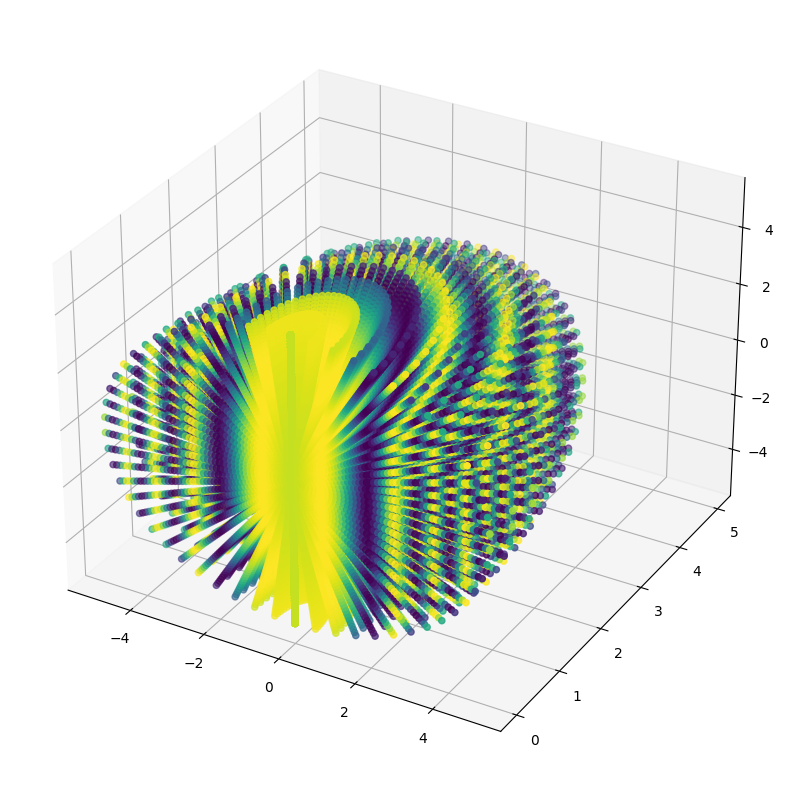

In [116]:
nrs=50
nas=30
rr=np.linspace(0,5,nrs)
phi=np.linspace(0,(2/4)*2*np.pi,nas)
theta=np.linspace(0,np.pi,nas)

R,O,TH=np.meshgrid(rr,phi,theta)
X=R*np.cos(O)*np.sin(TH)
Y=R*np.sin(O)*np.sin(TH)
Z=R*np.cos(TH)

fig3=plt.figure(figsize=(10,10))
cx = fig3.add_subplot(111, projection='3d')
#plt.axis('equal')
col=np.real(Ex(X,Y,Z,2))
cx.scatter(X,Y,Z,c=col)
#cx.plot_surface(X,Y,Z,c=col)

In [131]:
fig3=plt.figure(figsize=(10,10))
ax = fig3.add_subplot(111, projection='3d')
plt.axis('equal')

def animate(i):
    ax.clear()
    plt.axis('equal')
    ax.view_init(elev=40, azim=i)
    col=np.real(E(X,Y,Z,i))
    ax.scatter(X,Y,Z,c=col)
    ax.axis('equal')
    #plt.legend()
    return fig3

#fr=np.linspace(0,len(ts),n,dtype=int)
anim=FuncAnimation(fig3,animate,frames=200,interval=24)
video=anim.to_html5_video()
html=display.HTML(video)
display.display(html)
plt.close()

In [139]:
xx=np.linspace(-4*np.pi,4*np.pi,1000)
X,Y=np.meshgrid(xx,xx)

In [140]:
fig2=plt.figure(figsize=(10,10))
bx = fig2.add_subplot(111)

def animate(i):
    bx.clear()
    #bx.view_init(elev=15, azim=i)
    #Campo Electrico
    El=bx.contourf(X,Y,np.real(Ex(X,Y,X*0,i)),cmap='plasma',levels=30)
    #bx.colorbar(El)
    #ax.quiver(xx1,xx1*0,xx1*0,xx1*0,xx1*0,np.real(E(xx1,xx1*0,xx1*0,i)),color='blue')
    #Campo Magnetico
    #bx.plot(X,np.real(E(xx,xx*0,xx*0,i)),xx*0,color='red')
    #ax.quiver(xx1,xx1*0,xx1*0,xx1*0,np.real(E(xx1,xx1*0,xx1*0,i)),xx1*0,color='red')
    #plt.axis('equal')
    return fig2

#fr=np.linspace(0,len(ts),n,dtype=int)
anim=FuncAnimation(fig2,animate,frames=100,interval=24)
video=anim.to_html5_video()
html=display.HTML(video)
display.display(html)
plt.close()

## Onda que gira

In [167]:
r=sp.Matrix([x,y,z])
k=sp.Matrix([0,0,1])
kn=k.norm()
w=0.04
E0=sp.Matrix([1,sp.exp(1j*(sp.pi/2)),0])


In [176]:
E=E0*sp.exp((k.dot(r)-w*t)*1j)#sp.Matrix([sp.exp((k.dot(r)-w*t)*1j),sp.exp((k.dot(r)-w*t)*1j),0])
Ex=sp.lambdify([x,y,z,t],E[0])
Ey=sp.lambdify([x,y,z,t],E[1])
Ez=sp.lambdify([x,y,z,t],E[2])

B=(k/kn).cross(E)
Bx=sp.lambdify([x,y,z,t],B[0])
By=sp.lambdify([x,y,z,t],B[1])
Bz=sp.lambdify([x,y,z,t],B[2])

In [178]:

zz=np.linspace(-3,2*2*np.pi,500)
zz1=np.linspace(-3,2*2*np.pi,40)
fig=plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
plt.axis('equal')

def animate(i):
    ax.clear()
    plt.axis('equal')
    ax.view_init(elev=10, azim=i/10)
    #Campo Electrico
    ax.plot(np.real(Ex(zz*0,zz*0,zz,i)),np.real(Ey(zz*0,zz*0,zz,i)),zz,color='red')
    ax.quiver(zz1*0,zz1*0,zz1,np.real(Ex(zz1*0,zz1*0,zz1,i)),np.real(Ey(zz1*0,zz1*0,zz1,i)),zz1*0,color='red')
    #Campo Magnetico
    plt.xlim([0,2*np.pi])
    ax.plot(np.real(Bx(zz*0,zz*0,zz,i)),np.real(By(zz*0,zz*0,zz,i)),zz,color='blue')
    ax.quiver(zz1*0,zz1*0,zz1,np.real(Bx(zz1*0,zz1*0,zz1,i)),np.real(By(zz1*0,zz1*0,zz1,i)),zz1*0,color='blue')
    return fig

fr=np.linspace(0,300,100,dtype=int)
anim=FuncAnimation(fig,animate,frames=fr,interval=24)
video=anim.to_html5_video()
html=display.HTML(video)
display.display(html)
plt.close()